# Import Libraries and Functions

In [1]:
import sys
import importlib
import joblib
import os
import math
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import tensorflow as tf
from matplotlib.backends.backend_pdf import PdfPages
import time
from tqdm import tqdm
import gc

2026-09-09 13:53:45.011570: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-09-09 13:53:45.045404: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-09-09 13:53:45.045434: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-09-09 13:53:45.046630: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-09-09 13:53:45.053732: I tensorflow/core/platform/cpu_feature_guar

In [2]:
sys.path.append("../../analysis_tools")

In [3]:
# importlib.reload(data_extraction)
from data_extraction import DataExtraction2D
# import data_plot

# importlib.reload(data_plot)  
from data_plot import DataPlot

import data_calculation

# import modelData_processor
# importlib.reload(modelData_processor)
from modelData_processor import ModelDataProcessor

# import model_Analysis
# importlib.reload(model_Analysis)
from model_Analysis import ModelAnalysis

# importlib.reload(data_plot)  
from data_plot import DataPlot
from sklearn.metrics import r2_score, mean_squared_error

# Data Preparation

In [4]:
data_extractor = DataExtraction2D()

In [5]:
df_output = data_extractor.GetScenariosToPD(filename = "../../Data/DUCK_SWAN_Data/swan_Log_DUCK.txt")

     Wind Value Wind Direction Wave Height Wave Direction  Iterations
0             1              0         1.6            -20          13
1             1              0         1.6              0          14
2             1              0         1.6             20          16
3             1              0         1.6             40          18
4             1              0         1.6             60          19
...         ...            ...         ...            ...         ...
3835          8            315         2.6             80          19
3836          8            315         2.6            100          18
3837          8            315         2.6            120          18
3838          8            315         2.6            140          15
3839          8            315         2.6            160          14

[3840 rows x 5 columns]


In [6]:
df_converged = df_output[df_output['Iterations'] != 50]
print(df_converged)

     Wind Value Wind Direction Wave Height Wave Direction  Iterations
0             1              0         1.6            -20          13
1             1              0         1.6              0          14
2             1              0         1.6             20          16
3             1              0         1.6             40          18
4             1              0         1.6             60          19
...         ...            ...         ...            ...         ...
3835          8            315         2.6             80          19
3836          8            315         2.6            100          18
3837          8            315         2.6            120          18
3838          8            315         2.6            140          15
3839          8            315         2.6            160          14

[3840 rows x 5 columns]


In [7]:
relevant_keys = set(
    zip(
        df_converged["Wind Value"].astype(int),
        df_converged["Wind Direction"].astype(int),
        df_converged["Wave Height"].astype(float),
        df_converged["Wave Direction"].astype(int),
    )
)

In [8]:
hsig_data = data_extractor.get_specific_data("../../Data/DUCK_SWAN_Data/DUCK_training_hsig.txt", 'hsig', relevant_keys)
forces_data = data_extractor.get_specific_data("../../Data/DUCK_SWAN_Data/DUCK_training_forces.txt", 'forces', relevant_keys)

In [9]:
df = data_extractor.DataConcat(relevant_keys, hsig_data, forces_data)

In [10]:
df_xp= pd.read_csv('../../Data/DUCK_SWAN_Data/2d_duck_xp.txt', sep='\t', header=None)
df_yp= pd.read_csv('../../Data/DUCK_SWAN_Data/2d_duck_yp.txt', sep='\t', header=None)
xp_vector = df_xp.values.flatten()
yp_vector = df_yp.values.flatten()

# Plot SWAN Output

## Significant Wave Height

In [11]:
key = (8, 45, 2.4, 0)
hsig_data_result = hsig_data[key]

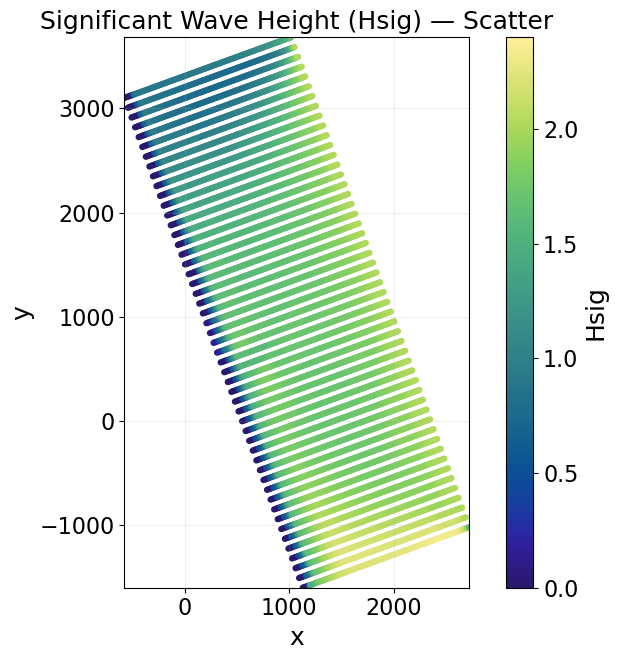

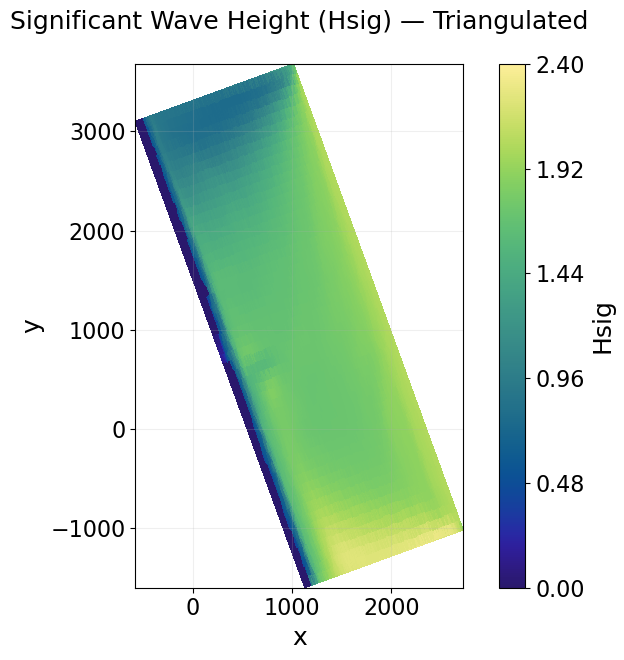

(<Figure size 800x700 with 2 Axes>,
 <Axes: title={'center': 'Significant Wave Height (Hsig) — Triangulated'}, xlabel='x', ylabel='y'>)

In [12]:
DataPlot.plot_scatter(
    xp_vector, yp_vector, hsig_data_result,
    component='hsig',
    title_prefix='hsig',
    cbar_range=(0, 2.4),
    dpi=300
)

DataPlot.plot_triangulation(
    xp_vector, yp_vector, hsig_data_result,
    component='hsig',
    title_prefix='hsig',
    cbar_range=(0, 2.4),
    dpi=300
)

## Forces

In [13]:
key = (8, 45, 2.4, 0)
arr = np.asarray(forces_data[key], dtype=float)   # shape: (N, 2)
x_forces_result = arr[:, 0]
y_forces_result = arr[:, 1]

In [14]:
x_forces_result.max()

9.542

In [15]:
x_forces_result.min()

-67.07

In [16]:
smallest_k = np.sort(x_forces_result)[:50]
print(smallest_k)

[-67.07 -34.64 -34.02 -33.79 -33.26 -32.56 -31.2  -31.12 -31.12 -31.06
 -30.66 -30.47 -29.76 -29.61 -28.66 -27.75 -27.59 -27.58 -27.43 -27.32
 -27.16 -27.08 -27.02 -26.99 -26.93 -26.81 -26.62 -26.56 -26.52 -26.38
 -26.38 -26.34 -26.22 -25.98 -25.94 -25.89 -25.44 -25.17 -24.54 -24.34
 -24.3  -23.82 -23.81 -23.78 -23.64 -23.59 -23.54 -23.38 -23.1  -23.08]


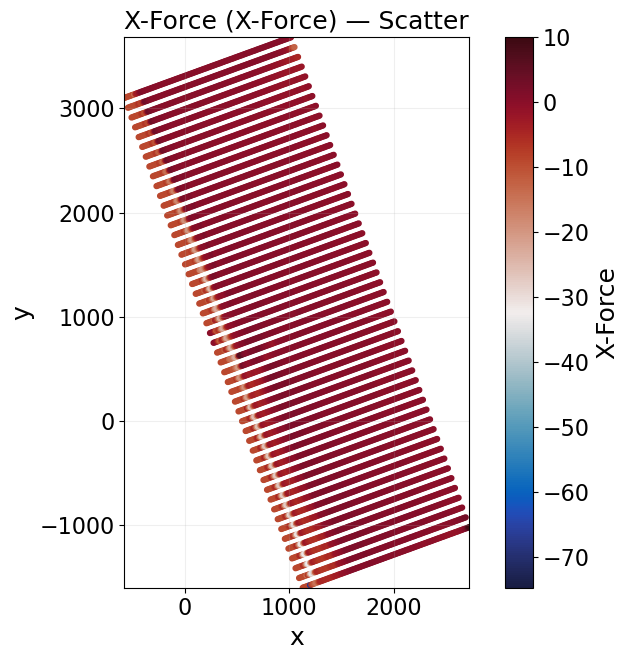

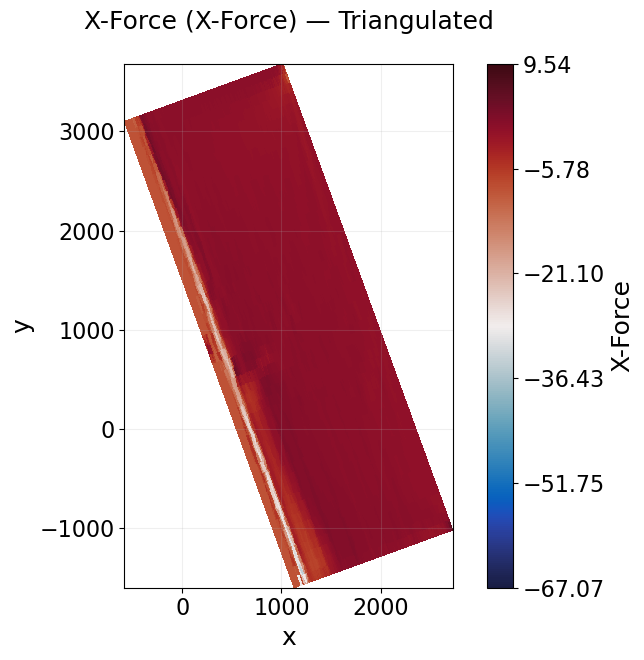

(<Figure size 800x700 with 2 Axes>,
 <Axes: title={'center': 'X-Force (X-Force) — Triangulated'}, xlabel='x', ylabel='y'>)

In [17]:
DataPlot.plot_scatter(
    xp_vector, yp_vector,x_forces_result,
    component='x',
    title_prefix='X-Force',
    cbar_range=(10, -68),
    dpi=300
)

DataPlot.plot_triangulation(
    xp_vector, yp_vector,x_forces_result,
    component='x',
    title_prefix='X-Force',
    # cbar_range=(0, 1.75),
    dpi=300
)

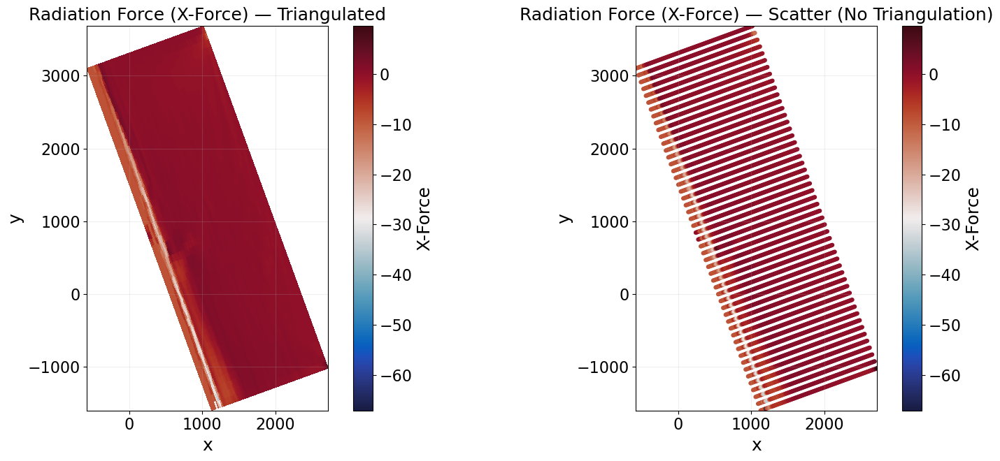

In [18]:
DataPlot.plotSWANResult_old(
    xp_vector, yp_vector,
    prediction_result=x_forces_result,
    # valid_mask_array=None,
    # valid_mask=False,
    component='x',
    # cbar_range=(-10, 5)
)

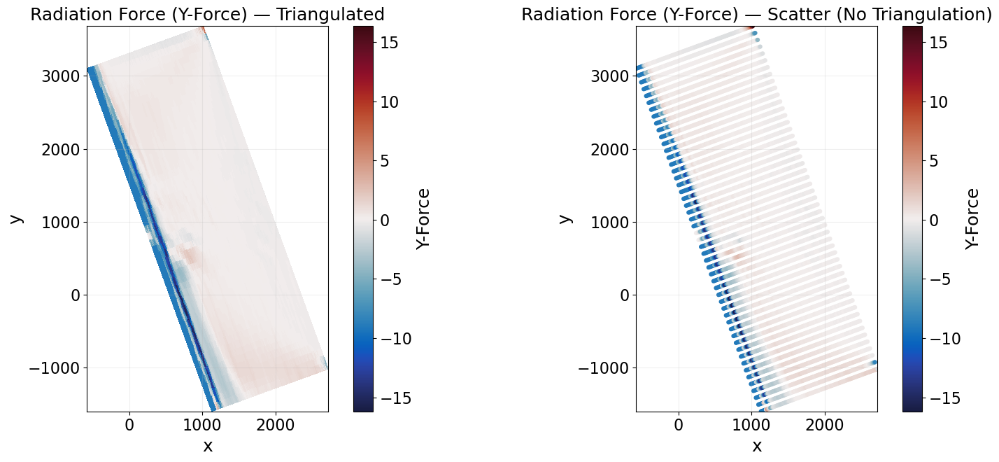

In [19]:
DataPlot.plotSWANResult_old(
    xp_vector, yp_vector,
    prediction_result=y_forces_result,
    component='y'
)

# Model Prediction and Plots

### Get Test Cases

In [11]:
with open("../../Data/DUCK_SWAN_Data/DUCK_dataset.pkl", "rb") as f:
    loaded_data = pickle.load(f)

train_data = loaded_data["train"]
val_data = loaded_data["val"]
test_data = loaded_data["test"]

In [12]:
df["key"] = list(zip(df["Wind Value"], df["Wind Direction"], df["Wave Height"], df["Wave Direction"]))
test_df = df[df["key"].isin(test_data)]

##  Single Scenario: Plot and Visualization

### x-forces

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
2026-09-09 13:54:13.995444: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 866 MB memory:  -> device: 0, name: NVIDIA L40S, pci bus id: 0000:be:00.0, compute capability: 8.9


Model: "don_nn"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model (Functional)          (None, 30)                54174     
                                                                 
 model_1 (Functional)        (None, 30)                40446     
                                                                 
Total params: 94621 (369.61 KB)
Trainable params: 94621 (369.61 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Prediction time: 0.075634 seconds


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Max AE = 2.5538 at (x=312.00, y=1085.00)
True value at this location = -3.2450


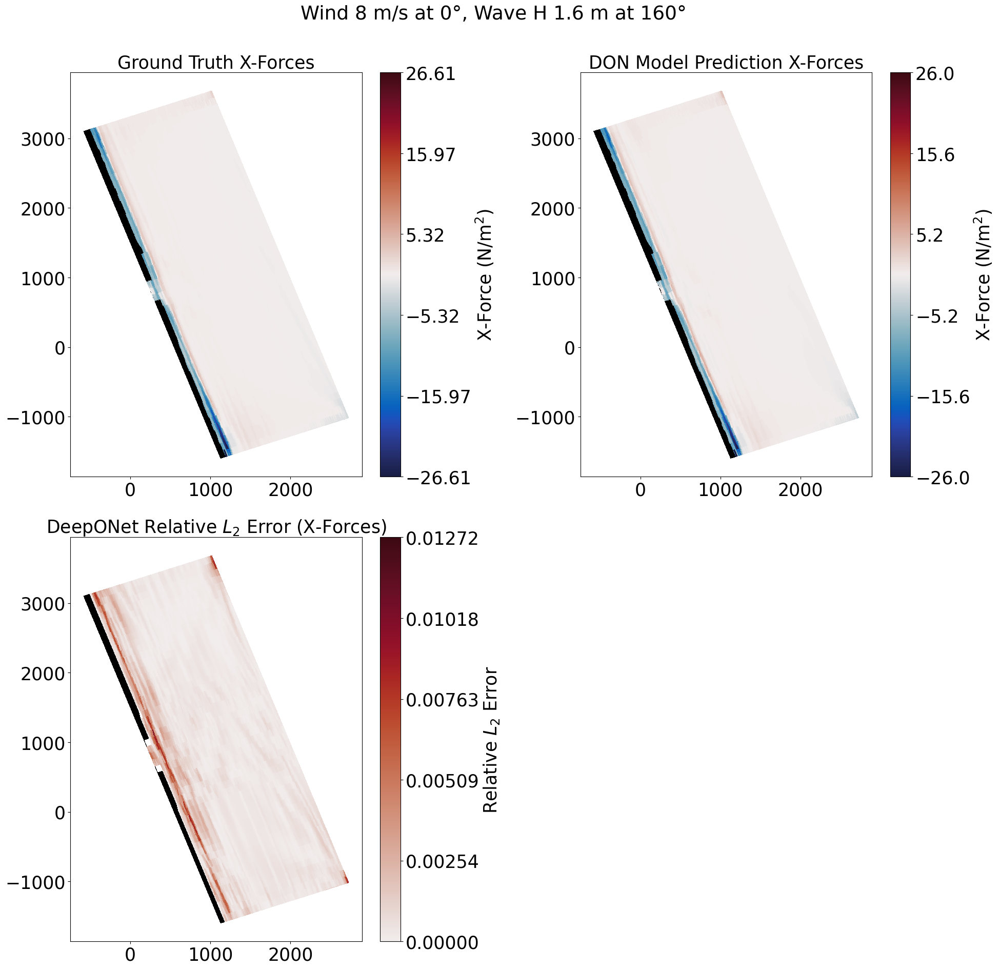

(<Figure size 2200x2200 with 7 Axes>,
 array([[<Axes: title={'center': 'Ground Truth X-Forces'}>,
         <Axes: title={'center': 'DON Model Prediction X-Forces'}>],
        [<Axes: title={'center': 'DeepONet Relative $L_2$ Error (X-Forces)'}>,
         <Axes: >]], dtype=object))

In [13]:
DataPlot.plot_duck_scenario(
    test_df, 8, 0, 1.6, 160,
    xp_vector, yp_vector,
    component="x",
    text_size=25,
    model_dir="../../Models/model_DUCK_xforces",
    clip_min = -65,
    # save_path = "."
    
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Max AE = 2.5538 at (x=312.00, y=1085.00)
True value at this location = -3.2450
Max-error node falls in transect segment 28.


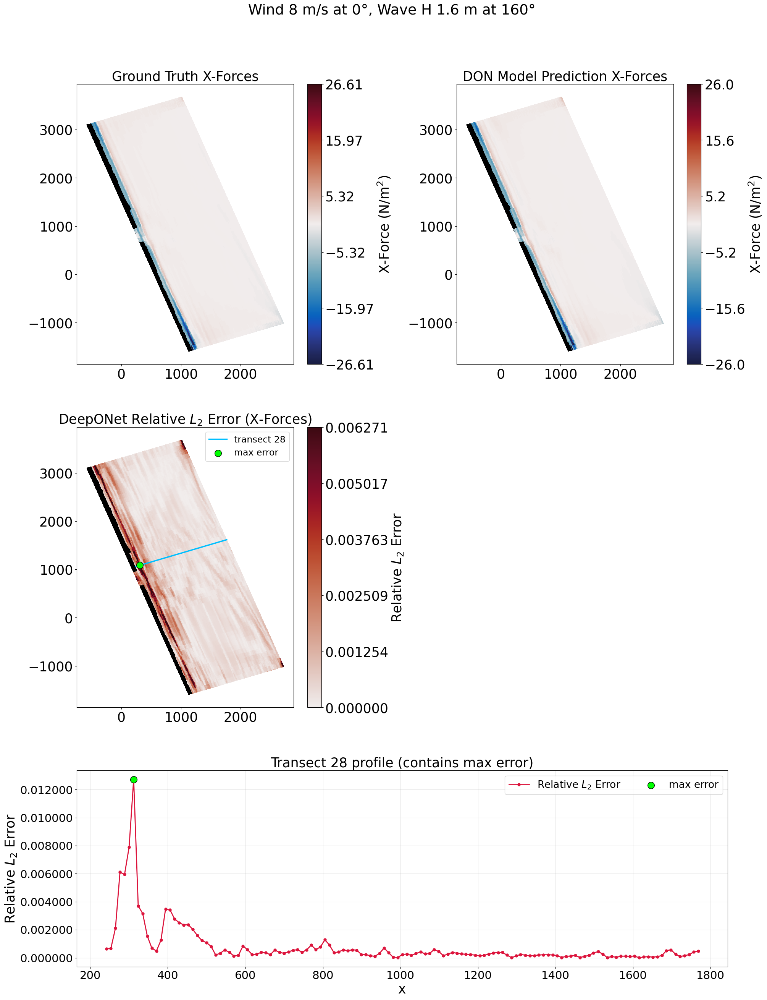

In [14]:
fig, info = DataPlot.plot_duck_scenario_transect(
    test_df, 8, 0, 1.6, 160,
    xp_vector, yp_vector,
    component="x",
    text_size=25,
    model_dir="../../Models/model_DUCK_xforces",
    clip_min=-65,
    # save_path=".",
    err_cbar_max=99,
    segment=None,   # or any integer index
    profile_show="error",        # "all" | "values" | "error"
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


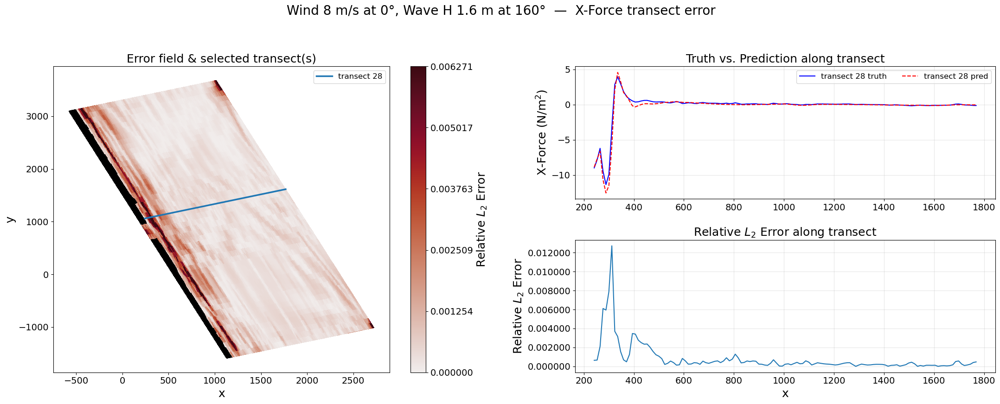

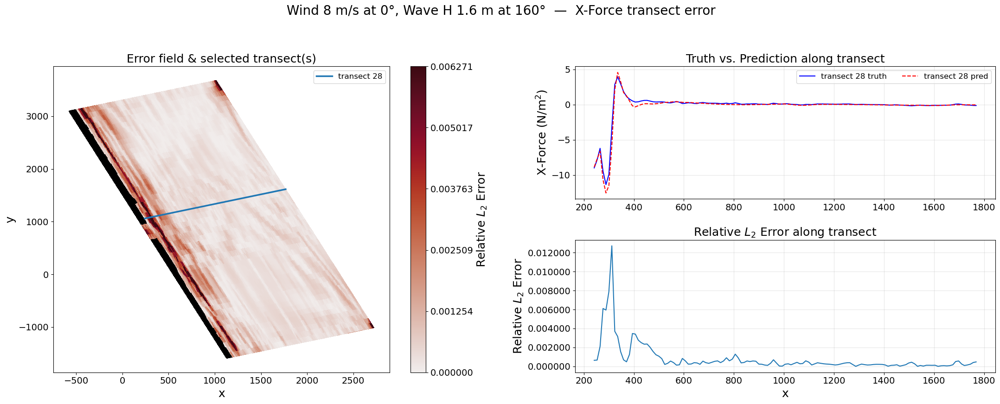

In [15]:
DataPlot.plot_transect_error(
   test_df, 8, 0, 1.6, 160,
    xp_vector, yp_vector,
    segment=28, component="x",
    error_type="relative_l2", along="auto",
    model_dir="../../Models/model_DUCK_xforces",
     truth_color="blue",      
    pred_color="red", 
    err_cbar_max=99,
    # save_path=".",
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Model: "don_nn"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model (Functional)          (None, 30)                54174     
                                                                 
 model_1 (Functional)        (None, 30)                40446     
                                                                 
Total params: 94621 (369.61 KB)
Trainable params: 94621 (369.61 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Prediction time: 0.043248 seconds


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Max AE = 2.7513 at (x=527.90, y=418.60)
True value at this location = -4.7280


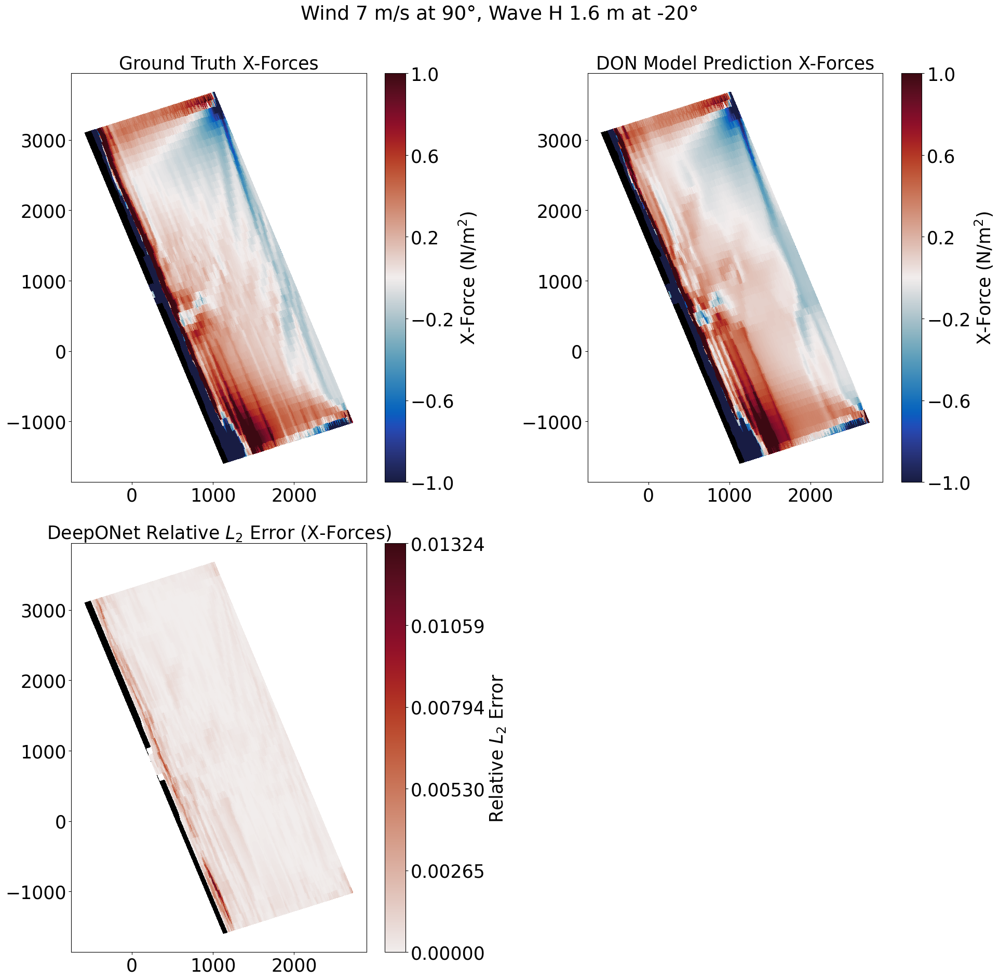

(<Figure size 2200x2200 with 7 Axes>,
 array([[<Axes: title={'center': 'Ground Truth X-Forces'}>,
         <Axes: title={'center': 'DON Model Prediction X-Forces'}>],
        [<Axes: title={'center': 'DeepONet Relative $L_2$ Error (X-Forces)'}>,
         <Axes: >]], dtype=object))

In [16]:
DataPlot.plot_duck_scenario(
    test_df, 7, 90, 1.6, -20,
    xp_vector, yp_vector,
    component="x",
    text_size=25,
    model_dir="../../Models/model_DUCK_xforces",
    cbar_range=(-1, 1),
    clip_min = -65,
    # save_path = "."
    
)

### y-forces

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Model: "don_nn"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model (Functional)          (None, 30)                54174     
                                                                 
 model_1 (Functional)        (None, 30)                40446     
                                                                 
Total params: 94621 (369.61 KB)
Trainable params: 94621 (369.61 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Prediction time: 0.044644 seconds


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Max AE = 1.5095 at (x=608.00, y=235.00)
True value at this location = -4.3530


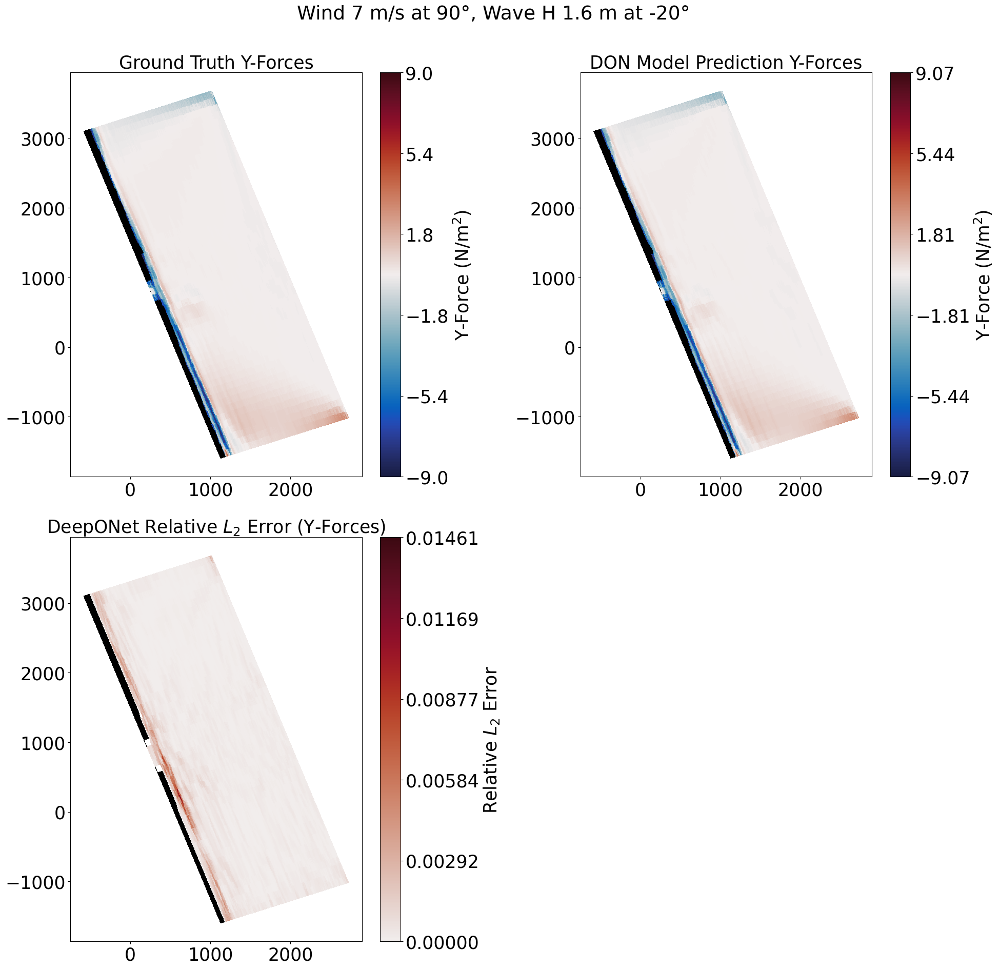

(<Figure size 2200x2200 with 7 Axes>,
 array([[<Axes: title={'center': 'Ground Truth Y-Forces'}>,
         <Axes: title={'center': 'DON Model Prediction Y-Forces'}>],
        [<Axes: title={'center': 'DeepONet Relative $L_2$ Error (Y-Forces)'}>,
         <Axes: >]], dtype=object))

In [22]:
DataPlot.plot_duck_scenario(
    test_df, 7, 90, 1.6, -20,
    xp_vector, yp_vector,
    component="y",
    model_dir="../../Models/model_DUCK_yforces",
    # save_path = "."
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


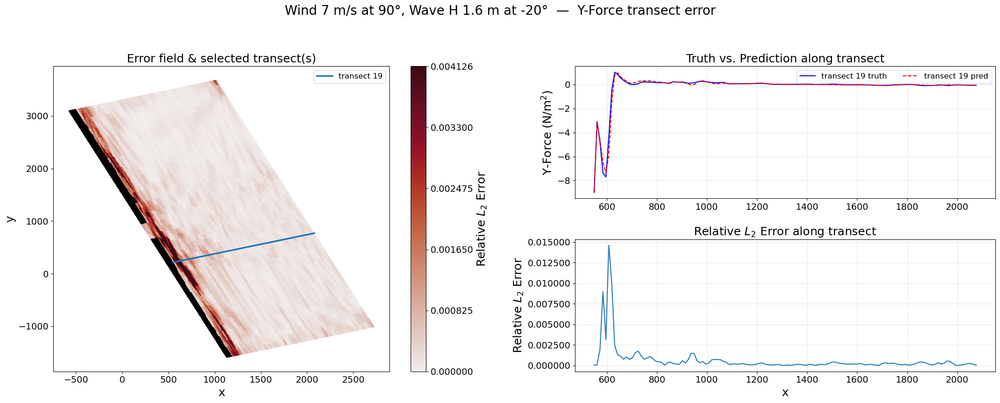

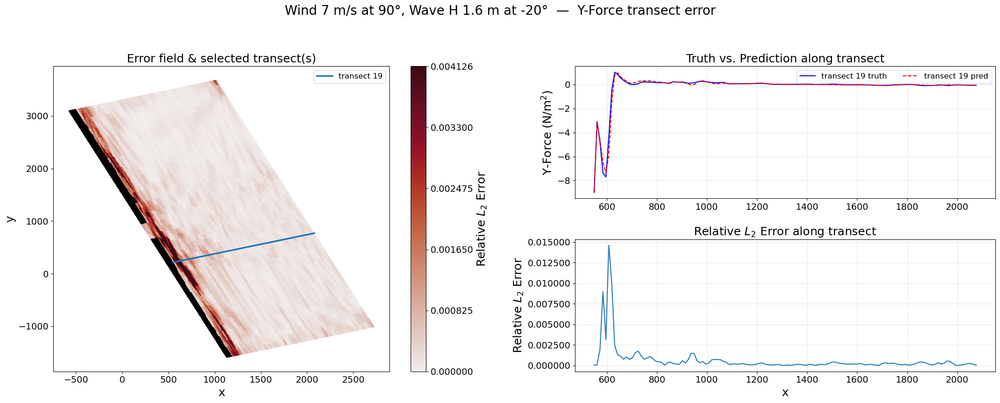

In [28]:
DataPlot.plot_transect_error(
   test_df, 7, 90, 1.6, -20,
    xp_vector, yp_vector,
    segment=19, component="y",
    error_type="relative_l2", along="auto",
    model_dir="../../Models/model_DUCK_yforces",
     truth_color="blue",      
    pred_color="red", 
    err_cbar_max=99,
    # save_path=".",
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Max AE = 1.5095 at (x=608.00, y=235.00)
True value at this location = -4.3530
Max-error node falls in transect segment 19.


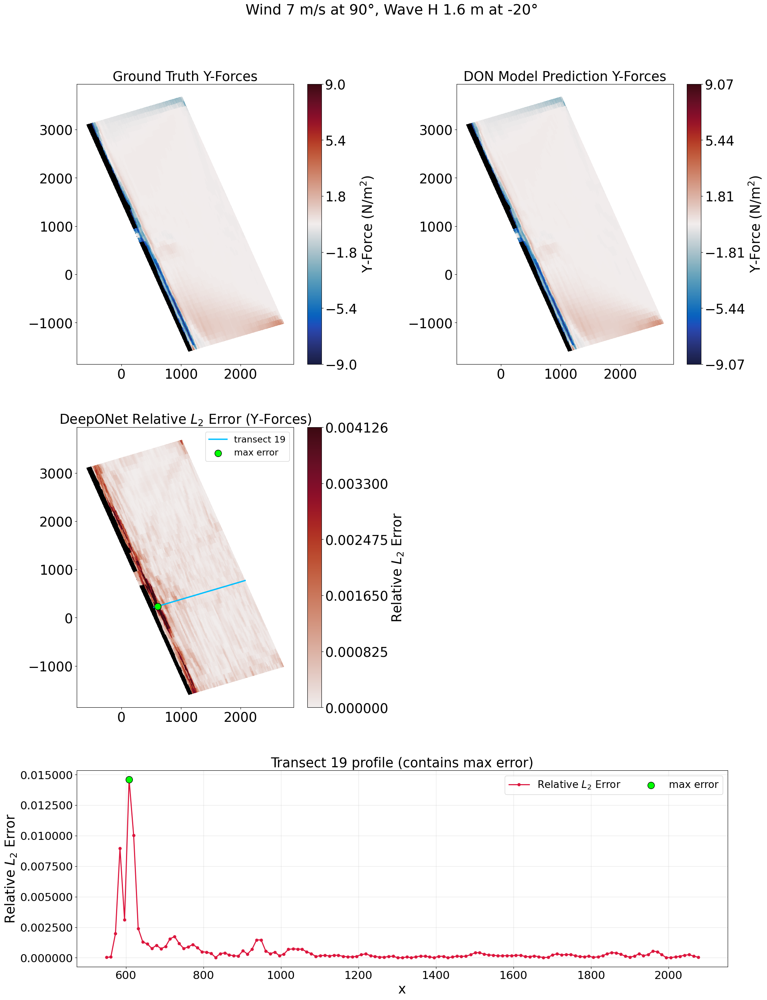

In [31]:
fig, info = DataPlot.plot_duck_scenario_transect(
    test_df, 7, 90, 1.6, -20,
    xp_vector, yp_vector,
    component="y",
    text_size=25,
    model_dir="../../Models/model_DUCK_yforces",
    # save_path=".",
    err_cbar_max=99,
    segment=None,   # or any integer index
    profile_show="error",
)

### Hsig

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Model: "don_nn"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model (Functional)          (None, 20)                1252      
                                                                 
 model_1 (Functional)        (None, 20)                39476     
                                                                 
Total params: 40729 (159.10 KB)
Trainable params: 40729 (159.10 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Prediction time: 0.044886 seconds


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Max AE = 0.0987 at (x=4.14, y=1931.00)
True value at this location = 0.6928


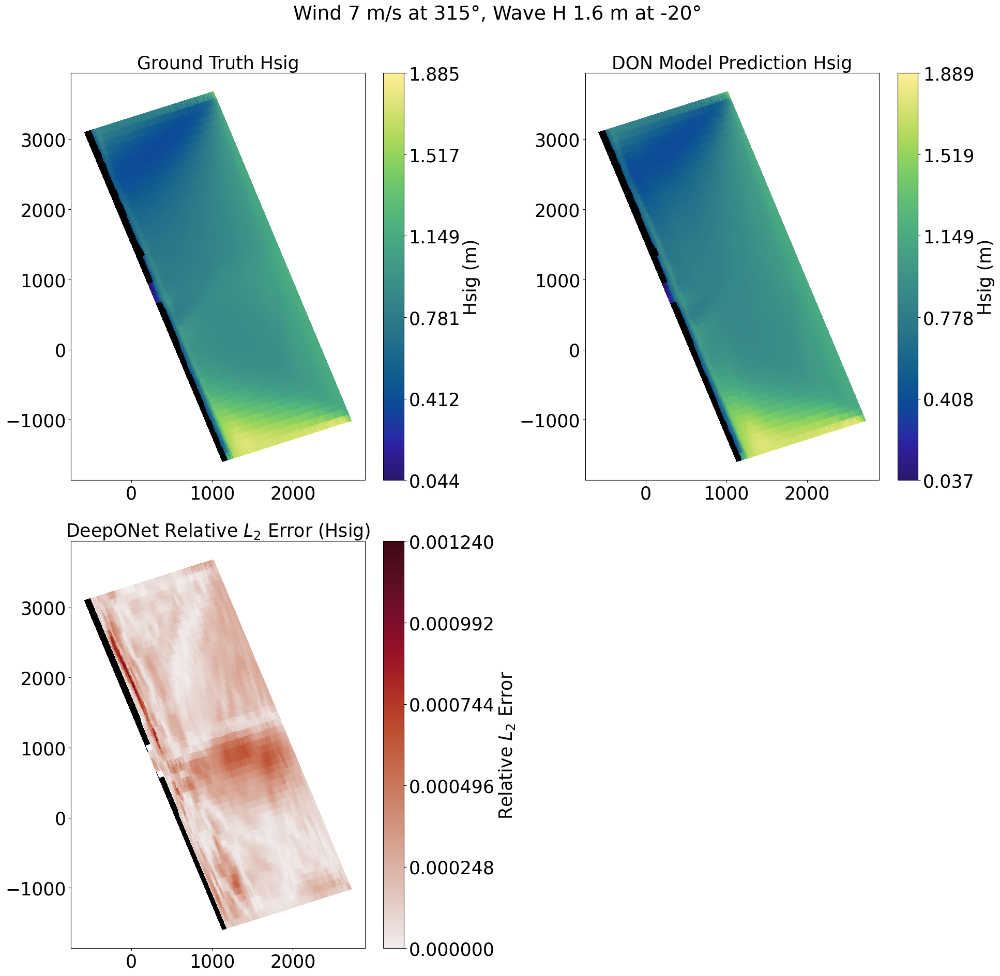

(<Figure size 2200x2200 with 7 Axes>,
 array([[<Axes: title={'center': 'Ground Truth Hsig'}>,
         <Axes: title={'center': 'DON Model Prediction Hsig'}>],
        [<Axes: title={'center': 'DeepONet Relative $L_2$ Error (Hsig)'}>,
         <Axes: >]], dtype=object))

In [32]:
DataPlot.plot_duck_scenario(
        test_df, 7, 315, 1.6, -20,
    xp_vector, yp_vector,
    component="hsig",
    model_dir="../../Models/model_DUCK_Hsig",
    # save_path = "."
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Max AE = 0.0987 at (x=4.14, y=1931.00)
True value at this location = 0.6928
Max-error node falls in transect segment 37.


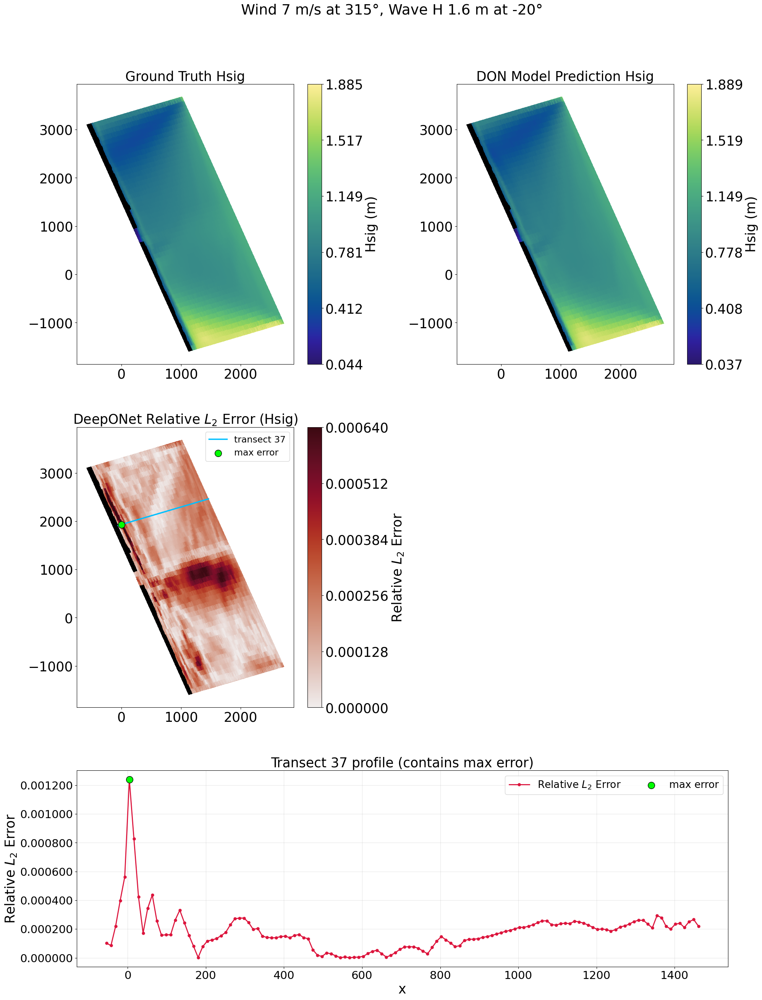

In [35]:
fig, info = DataPlot.plot_duck_scenario_transect(
    test_df, 7, 315, 1.6, -20,
    xp_vector, yp_vector,
    component="hsig",
    text_size=25,
    model_dir="../../Models/model_DUCK_Hsig",
    # save_path=".",
    err_cbar_max=99,
    segment=None,   # or any integer index
    profile_show="error",
    
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


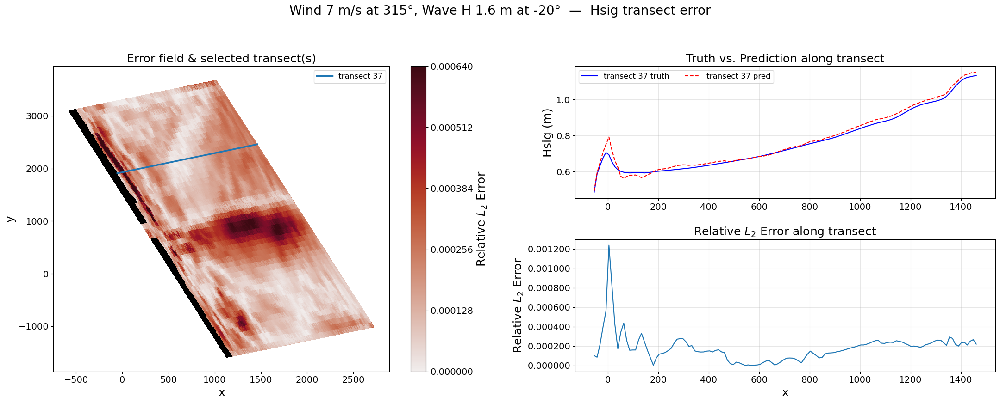

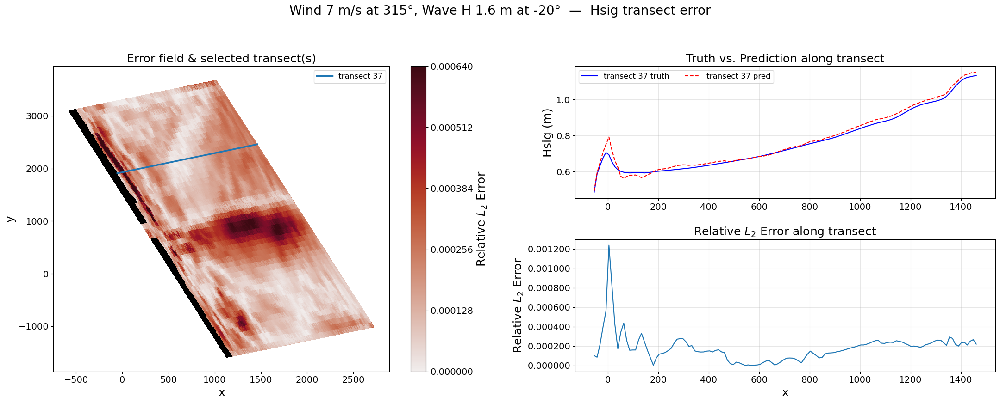

In [36]:
DataPlot.plot_transect_error(
    test_df, 7, 315, 1.6, -20,
    xp_vector, yp_vector,
    segment=37, component="hsig",
    error_type="relative_l2", along="auto",
    model_dir="../../Models/model_DUCK_Hsig",
     truth_color="blue",      
    pred_color="red", 
    err_cbar_max=99,
    # save_path=".",
)

## Generate and Save Test-Scenario Predictions (PDF)
### Caution: This process uses a large amount of memory and may cause the machine to freeze

#### y-forces

In [18]:
model_dir = "../../Models/model_DUCK_yforces"
model = tf.keras.models.load_model(model_dir, compile=False)
target = joblib.load(f"{model_dir}/target_scaler.pkl")
t0 = joblib.load(f"{model_dir}/scaler_col_0.pkl")
t1 = joblib.load(f"{model_dir}/scaler_col_1.pkl")
b01 = joblib.load(f"{model_dir}/scaler_factor_0_1.pkl")
b2 = joblib.load(f"{model_dir}/scaler_factor_2.pkl")
print("All components loaded successfully!")


All components loaded successfully!


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [19]:
component = "y"
total_scenarios = len(test_df)
chunk_size = 50
output_dir = "Y_forces_fig_outputs"
os.makedirs(output_dir, exist_ok=True)

test_df_small = test_df.head(5)        
total_scenarios = len(test_df_small)

print(f" Starting full run: {total_scenarios} scenarios...")

# Using tqdm for a visual progress bar
for chunk_idx in range(math.ceil(total_scenarios / chunk_size)):
    start = chunk_idx * chunk_size
    end = min((chunk_idx + 1) * chunk_size, total_scenarios)
    # df_chunk = test_df.iloc[start:end]
    df_chunk = test_df_small.iloc[start:end]
    
    pdf_name = os.path.join(output_dir, f"duck_{component}forces_part_{chunk_idx+1}.pdf")
    
    with PdfPages(pdf_name) as pdf:
        # Inner loop for scenarios in this chunk
        for i, (idx, row) in enumerate(df_chunk.iterrows()):
            start_iter = time.time()
            
            # Generate Plot
            fig = DataPlot.plot_duck_scenario_pdf(
                row, xp_vector, yp_vector,
                model, target, t0, t1, b01, b2,
                component=component
            )
            
            # Save and Cleanup
            pdf.savefig(fig, bbox_inches='tight')
            plt.close(fig)
            
            # Periodic Heartbeat Print (every 10 plots)
            if (i + 1) % 10 == 0:
                print(f"  [Chunk {chunk_idx+1}] Finished {i+1}/{len(df_chunk)} ")

    # Nuclear Cleanup after each PDF file is finalized
    plt.close('all')
    gc.collect()
    tf.keras.backend.clear_session()
    
    print(f"Saved: {pdf_name} ({end}/{total_scenarios} total completed)")

# 3. Final Report
print(f"\n ALL DONE!")

 Starting full run: 5 scenarios...
Saved: Y_forces_fig_outputs/duck_yforces_part_1.pdf (5/5 total completed)

 ALL DONE!


In [25]:
component = "y"
total_scenarios = len(test_df)
chunk_size = 50
output_dir = "Y_forces_fig_outputs"
os.makedirs(output_dir, exist_ok=True)

print(f" Starting full run: {total_scenarios} scenarios...")

# Using tqdm for a visual progress bar
for chunk_idx in range(math.ceil(total_scenarios / chunk_size)):
    start = chunk_idx * chunk_size
    end = min((chunk_idx + 1) * chunk_size, total_scenarios)
    df_chunk = test_df.iloc[start:end]
    
    pdf_name = os.path.join(output_dir, f"duck_{component}forces_part_{chunk_idx+1}.pdf")
    
    with PdfPages(pdf_name) as pdf:
        # Inner loop for scenarios in this chunk
        for i, (idx, row) in enumerate(df_chunk.iterrows()):
            start_iter = time.time()
            
            # Generate Plot
            fig = DataPlot.plot_duck_scenario_pdf(
                row, xp_vector, yp_vector,
                model, target, t0, t1, b01, b2,
                component=component
            )
            
            # Save and Cleanup
            pdf.savefig(fig, bbox_inches='tight')
            plt.close(fig)
            
            # Periodic Heartbeat Print (every 10 plots)
            if (i + 1) % 10 == 0:
                print(f"  [Chunk {chunk_idx+1}] Finished {i+1}/{len(df_chunk)} ")

    # Nuclear Cleanup after each PDF file is finalized
    plt.close('all')
    gc.collect()
    tf.keras.backend.clear_session()
    
    print(f"Saved: {pdf_name} ({end}/{total_scenarios} total completed)")

# 3. Final Report
print(f"\n ALL DONE!")

 Starting full run: 576 scenarios...
  [Chunk 1] Finished 10/50 
  [Chunk 1] Finished 20/50 
  [Chunk 1] Finished 30/50 
  [Chunk 1] Finished 40/50 
  [Chunk 1] Finished 50/50 
Saved: Y_forces_fig_outputs/duck_yforces_part_1.pdf (50/576 total completed)
  [Chunk 2] Finished 10/50 
  [Chunk 2] Finished 20/50 
  [Chunk 2] Finished 30/50 
  [Chunk 2] Finished 40/50 
  [Chunk 2] Finished 50/50 
Saved: Y_forces_fig_outputs/duck_yforces_part_2.pdf (100/576 total completed)
  [Chunk 3] Finished 10/50 
  [Chunk 3] Finished 20/50 
  [Chunk 3] Finished 30/50 
  [Chunk 3] Finished 40/50 
  [Chunk 3] Finished 50/50 
Saved: Y_forces_fig_outputs/duck_yforces_part_3.pdf (150/576 total completed)
  [Chunk 4] Finished 10/50 
  [Chunk 4] Finished 20/50 
  [Chunk 4] Finished 30/50 
  [Chunk 4] Finished 40/50 
  [Chunk 4] Finished 50/50 
Saved: Y_forces_fig_outputs/duck_yforces_part_4.pdf (200/576 total completed)
  [Chunk 5] Finished 10/50 
  [Chunk 5] Finished 20/50 
  [Chunk 5] Finished 30/50 
  [Chunk

#### x-forces

In [21]:
model_dir = "../../Models/model_DUCK_xforces"
model = tf.keras.models.load_model(model_dir, compile=False)
target = joblib.load(f"{model_dir}/target_scaler.pkl")
t0 = joblib.load(f"{model_dir}/scaler_col_0.pkl")
t1 = joblib.load(f"{model_dir}/scaler_col_1.pkl")
b01 = joblib.load(f"{model_dir}/scaler_factor_0_1.pkl")
b2 = joblib.load(f"{model_dir}/scaler_factor_2.pkl")
print("All components loaded successfully!")

All components loaded successfully!


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [22]:
component = "x"
total_scenarios = len(test_df)
chunk_size = 50
output_dir = "X_forces_fig_outputs"
os.makedirs(output_dir, exist_ok=True)

print(f" Starting full run: {total_scenarios} scenarios...")

# Using tqdm for a visual progress bar
for chunk_idx in range(math.ceil(total_scenarios / chunk_size)):
    start = chunk_idx * chunk_size
    end = min((chunk_idx + 1) * chunk_size, total_scenarios)
    df_chunk = test_df.iloc[start:end]
    
    pdf_name = os.path.join(output_dir, f"duck_{component}forces_part_{chunk_idx+1}.pdf")
    
    with PdfPages(pdf_name) as pdf:
        # Inner loop for scenarios in this chunk
        for i, (idx, row) in enumerate(df_chunk.iterrows()):
            start_iter = time.time()
            
            # Generate Plot
            fig = DataPlot.plot_duck_scenario_pdf(
                row, xp_vector, yp_vector,
                model, target,t0, t1, b01, b2,
                component=component,clip_min = -65
            )
            
            # Save and Cleanup
            pdf.savefig(fig, bbox_inches='tight')
            plt.close(fig)
            
            # Periodic Heartbeat Print (every 10 plots)
            if (i + 1) % 10 == 0:
                print(f"  [Chunk {chunk_idx+1}] Finished {i+1}/{len(df_chunk)} ")

    # Nuclear Cleanup after each PDF file is finalized
    plt.close('all')
    gc.collect()
    tf.keras.backend.clear_session()
    
    print(f"Saved: {pdf_name} ({end}/{total_scenarios} total completed)")

# 3. Final Report
print(f"\n ALL DONE!")

 Starting full run: 576 scenarios...
  [Chunk 1] Finished 10/50 
  [Chunk 1] Finished 20/50 
  [Chunk 1] Finished 30/50 
  [Chunk 1] Finished 40/50 
  [Chunk 1] Finished 50/50 
Saved: X_forces_fig_outputs/duck_xforces_part_1.pdf (50/576 total completed)
  [Chunk 2] Finished 10/50 
  [Chunk 2] Finished 20/50 
  [Chunk 2] Finished 30/50 
  [Chunk 2] Finished 40/50 
  [Chunk 2] Finished 50/50 
Saved: X_forces_fig_outputs/duck_xforces_part_2.pdf (100/576 total completed)
  [Chunk 3] Finished 10/50 
  [Chunk 3] Finished 20/50 
  [Chunk 3] Finished 30/50 
  [Chunk 3] Finished 40/50 
  [Chunk 3] Finished 50/50 
Saved: X_forces_fig_outputs/duck_xforces_part_3.pdf (150/576 total completed)
  [Chunk 4] Finished 10/50 
  [Chunk 4] Finished 20/50 
  [Chunk 4] Finished 30/50 
  [Chunk 4] Finished 40/50 
  [Chunk 4] Finished 50/50 
Saved: X_forces_fig_outputs/duck_xforces_part_4.pdf (200/576 total completed)
  [Chunk 5] Finished 10/50 
  [Chunk 5] Finished 20/50 
  [Chunk 5] Finished 30/50 
  [Chunk

#### Hsig

In [11]:
model_dir = "../../Models/model_DUCK_Hsig"
model = tf.keras.models.load_model(model_dir, compile=False)
target = joblib.load(f"{model_dir}/target_scaler.pkl")
t0 = joblib.load(f"{model_dir}/scaler_col_0.pkl")
t1 = joblib.load(f"{model_dir}/scaler_col_1.pkl")
b01 = joblib.load(f"{model_dir}/scaler_factor_0_1.pkl")
b2 = joblib.load(f"{model_dir}/scaler_factor_2.pkl")
print("All components loaded successfully!")


2026-03-31 10:50:22.552502: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43475 MB memory:  -> device: 0, name: NVIDIA L40S, pci bus id: 0000:be:00.0, compute capability: 8.9


All components loaded successfully!


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [20]:
component = "hsig"
total_scenarios = len(test_df)
chunk_size = 50
output_dir = "Hsig_forces_fig_outputs"
os.makedirs(output_dir, exist_ok=True)

print(f" Starting full run: {total_scenarios} scenarios...")

# Using tqdm for a visual progress bar
for chunk_idx in range(math.ceil(total_scenarios / chunk_size)):
    start = chunk_idx * chunk_size
    end = min((chunk_idx + 1) * chunk_size, total_scenarios)
    df_chunk = test_df.iloc[start:end]
    
    pdf_name = os.path.join(output_dir, f"duck_{component}_part_{chunk_idx+1}.pdf")
    
    with PdfPages(pdf_name) as pdf:
        # Inner loop for scenarios in this chunk
        for i, (idx, row) in enumerate(df_chunk.iterrows()):
            start_iter = time.time()
            
            # Generate Plot
            fig = DataPlot.plot_duck_scenario_pdf(
                row, xp_vector, yp_vector,
                model, target,t0, t1, b01, b2,
                component=component,
            )
            
            # Save and Cleanup
            pdf.savefig(fig, bbox_inches='tight')
            plt.close(fig)
            
            # Periodic Heartbeat Print (every 10 plots)
            if (i + 1) % 10 == 0:
                print(f"  [Chunk {chunk_idx+1}] Finished {i+1}/{len(df_chunk)} ")

    # Nuclear Cleanup after each PDF file is finalized
    plt.close('all')
    gc.collect()
    tf.keras.backend.clear_session()
    
    print(f"Saved: {pdf_name} ({end}/{total_scenarios} total completed)")

# 3. Final Report
print(f"\n ALL DONE!")

 Starting full run: 576 scenarios...
  [Chunk 1] Finished 10/50 
  [Chunk 1] Finished 20/50 
  [Chunk 1] Finished 30/50 
  [Chunk 1] Finished 40/50 
  [Chunk 1] Finished 50/50 
Saved: Hsig_forces_fig_outputs/duck_hsig_part_1.pdf (50/576 total completed)
  [Chunk 2] Finished 10/50 
  [Chunk 2] Finished 20/50 
  [Chunk 2] Finished 30/50 
  [Chunk 2] Finished 40/50 
  [Chunk 2] Finished 50/50 
Saved: Hsig_forces_fig_outputs/duck_hsig_part_2.pdf (100/576 total completed)
  [Chunk 3] Finished 10/50 
  [Chunk 3] Finished 20/50 
  [Chunk 3] Finished 30/50 
  [Chunk 3] Finished 40/50 
  [Chunk 3] Finished 50/50 
Saved: Hsig_forces_fig_outputs/duck_hsig_part_3.pdf (150/576 total completed)
  [Chunk 4] Finished 10/50 
  [Chunk 4] Finished 20/50 
  [Chunk 4] Finished 30/50 
  [Chunk 4] Finished 40/50 
  [Chunk 4] Finished 50/50 
Saved: Hsig_forces_fig_outputs/duck_hsig_part_4.pdf (200/576 total completed)
  [Chunk 5] Finished 10/50 
  [Chunk 5] Finished 20/50 
  [Chunk 5] Finished 30/50 
  [Chunk

# Model Analysis

## Function to Plot Parity

In [22]:
def plot_parity_scenario(test_df, scenario_idx, xp_vector, yp_vector, 
                         model_dir, component="x"):
    """
    Generates a parity (1:1) plot for all spatial nodes of a single scenario.
    """
    # 1. Get the specific row from test_df
    # If scenario_idx is the absolute index (df_idx), use loc. 
    # If it is the position, use iloc.
    row = test_df.iloc[scenario_idx]
    model = tf.keras.models.load_model(model_dir, compile=False)
    
    target_scaler = joblib.load(f"{model_dir}/target_scaler.pkl")

    
    # 2. Re-use your existing prediction and truth extraction logic
    true_vec = ModelAnalysis._true_vector_for_component(row, component)
    pred_full, valid_mask = ModelAnalysis._predict_one_case(
        row, xp_vector, yp_vector, model, target_scaler, model_dir
    )

    # 3. Filter for valid (wet) nodes only
    true = true_vec[valid_mask]
    pred = pred_full[valid_mask]

    # 4. Calculate Statistics
    r2 = r2_score(true,pred)
    rmse = np.sqrt(mean_squared_error(true, pred))
    
    # Global L2 Error (the metric we discussed)
    l2_error = (np.linalg.norm(true - pred) / np.linalg.norm(true)) * 100

    # 5. Plotting
    plt.figure(figsize=(8, 8))
    
    # Scatter points
    plt.scatter(true, pred, alpha=0.5, edgecolors='k', s=25, label="Spatial Nodes")
    
    # Identity Line (1:1)
    limit_min = min(true.min(), pred.min())
    limit_max = max(true.max(), pred.max())
    plt.plot([limit_min, limit_max], [limit_min, limit_max], 
             color='red', linestyle='--', linewidth=2, label="1:1 Perfect Match")

    # Labels and Metadata
    plt.xlabel(f"Ground Truth {component.upper()}-Force (N/m$^2$)", fontsize=12)
    plt.ylabel(f"Predicted {component.upper()}-Force (N/m$^2$)", fontsize=12)
    
    plt.grid(alpha=0.3)
    plt.legend()
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

    return {"r2": r2, "rmse": rmse, "l2_error": l2_error}

In [23]:
def plot_parity_subplot(ax, test_df, scenario_idx, xp_vector, yp_vector, model_dir, component="x", title_prefix="", apply_outlier_filter=False, outlier_threshold=-60):
    """
    Modified version to plot on a specific axis for subplots.
    """
    row = test_df.iloc[scenario_idx]
    target_scaler = joblib.load(f"{model_dir}/target_scaler.pkl")
    model = tf.keras.models.load_model(model_dir, compile=False)

    # Prediction logic
    true_vec = ModelAnalysis._true_vector_for_component(row, component)
    pred_full, valid_mask = ModelAnalysis._predict_one_case(
        row, xp_vector, yp_vector, model, target_scaler, model_dir
    )
    mask = valid_mask
    if apply_outlier_filter:
        outlier_mask = (true_vec > outlier_threshold) 
        mask = valid_mask & outlier_mask
        print(f"Applying filter: Removing values <= {outlier_threshold}")

    # Combine with your existing valid_mask
    true = true_vec[mask]
    pred = pred_full[mask]

    # Stats
    r2 = r2_score(true, pred)
    l2_error = (np.linalg.norm(true - pred) / np.linalg.norm(true)) * 100

    # Plotting on the passed 'ax'
    ax.scatter(true, pred, alpha=0.3, s=10, color='blue', edgecolors='none')
    
    # 1:1 Line
    low, high = min(true.min(), pred.min()), max(true.max(), pred.max())
    ax.plot([low, high], [low, high], color='red', linestyle='--', lw=1.5)

    # Metadata for Title
    # h_sig = row.get('Hsig', row.get('hsig', 0.0))
    ax.set_title(f"{title_prefix} (Idx: {scenario_idx})| $L_2$ Err: {l2_error:.2f}%", fontsize=16)
    ax.set_xlabel("Ground Truth ($N/m^2$)", fontsize=16)
    ax.set_ylabel("Predicted ($N/m^2$)", fontsize=16)
    ax.grid(alpha=0.2)
    ax.set_aspect('equal')

## y-forces

### Relative L2 Error Across All Test Scenarios¶

In [24]:
plt.rcParams.update({
        "figure.figsize": (50, 50),
        "lines.linewidth": 2,
        "lines.markersize": 5,
        "lines.markeredgecolor": "black",
        "legend.fontsize": 20,
        "legend.frameon": False,
        "legend.title_fontsize": 20,
        "xtick.labelsize": 20,
        "ytick.labelsize": 20,
        "axes.labelsize": 25,
        "axes.titlesize": 25,
        "figure.figsize": (15, 8),
        "axes.labelpad": 10,
    })


In [25]:

results_y = ModelAnalysis.compute_metrics_comprehensive(     
    test_df=test_df,
    xp_vector=xp_vector,
    yp_vector=yp_vector,
    model_dir="../../Models/model_DUCK_yforces",
    component="y")


2026-09-09 11:32:36.887805: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 866 MB memory:  -> device: 0, name: NVIDIA L40S, pci bus id: 0000:be:00.0, compute capability: 8.9
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://sc

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


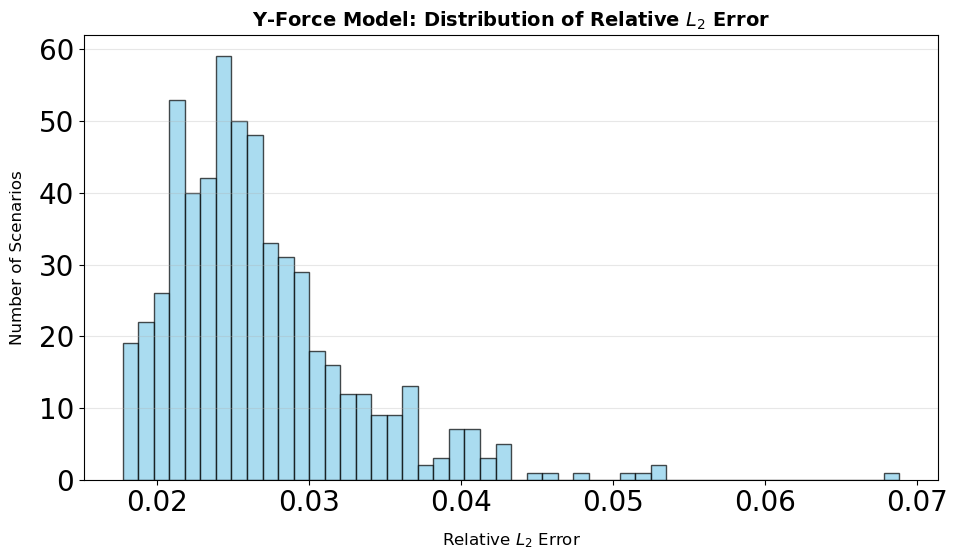

In [30]:
data = results_y["rel_l2_per_case"]
mean_val = np.mean(data)
median_val = np.median(data)

# 2. Plotting
plt.figure(figsize=(10, 6))
plt.hist(data, bins=50, color='skyblue', edgecolor='black', alpha=0.7)

plt.title("Y-Force Model: Distribution of Relative $L_2$ Error", fontsize=14, fontweight='bold')
plt.xlabel("Relative $L_2$ Error", fontsize=12)
plt.ylabel("Number of Scenarios", fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.legend(loc='upper right')

plt.tight_layout()
# plt.savefig("Y-ForceModel_Distribution_RelativeL2Error.pdf")
plt.show()

In [27]:
# 1. Convert to array and handle NaNs (if any)
arr = np.asarray(results_y["rel_l2_per_case"])
valid_mask = np.isfinite(arr)

# 2. Get indices that sort the array in ascending order (Best to Worst)
sorted_indices = np.where(valid_mask)[0]
sorted_indices = sorted_indices[np.argsort(arr[valid_mask])]

# 3. Identify the Best 3 (lowest relative error)
best_3_indices = sorted_indices[:3]

# 4. Identify the Worst 3 (highest relative error)
# We take the last 3 and reverse them so the absolute worst is first
worst_3_indices = sorted_indices[-3:][::-1]

# --- Display Results ---

print("--- TOP 3 BEST SCENARIOS (Lowest L2 Error) ---")
for i, idx in enumerate(best_3_indices, 1):
    print(f"Rank {i}: Index {idx:4d} | Rel L2 Error: {arr[idx]:.2f}")

print("\n--- TOP 3 WORST SCENARIOS (Highest L2 Error) ---")
for i, idx in enumerate(worst_3_indices, 1):
    print(f"Rank {i}: Index {idx:4d} | Rel L2 Error: {arr[idx]:.2f}")

--- TOP 3 BEST SCENARIOS (Lowest L2 Error) ---
Rank 1: Index  336 | Rel L2 Error: 0.02
Rank 2: Index  383 | Rel L2 Error: 0.02
Rank 3: Index  349 | Rel L2 Error: 0.02

--- TOP 3 WORST SCENARIOS (Highest L2 Error) ---
Rank 1: Index  140 | Rel L2 Error: 0.07
Rank 2: Index  410 | Rel L2 Error: 0.05
Rank 3: Index  300 | Rel L2 Error: 0.05


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinM

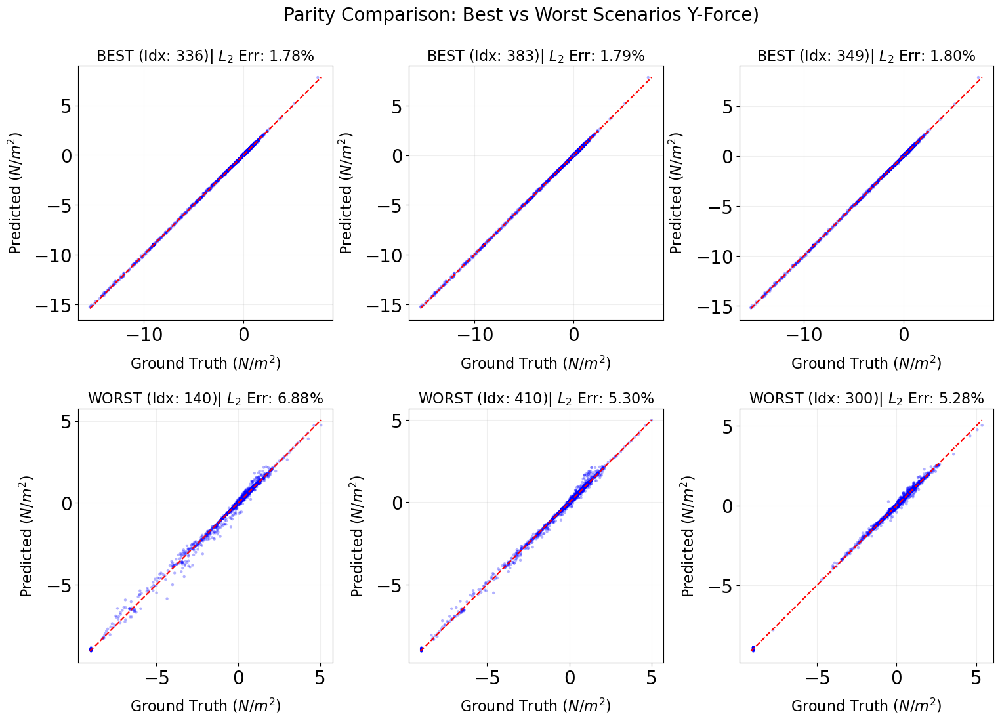

In [28]:
# Assuming you already have best_3 and worst_3 indices
# Create a 2-row, 3-column figure
fig, axs = plt.subplots(2, 3, figsize=(18, 12)) 
plt.subplots_adjust(hspace=0.3, wspace=0.3)

# --- Top Row: Best 3 ---
for i, idx in enumerate(best_3_indices):
    plot_parity_subplot(axs[0, i], 
                        test_df, 
                        idx, 
                        xp_vector, 
                        yp_vector, 
                        model_dir="/workspace/shukaic/github/archive/DON_DUCK/model_DUCK_yforces", 
                        component="y", 
                        title_prefix="BEST")

# --- Bottom Row: Worst 3 ---
for i, idx in enumerate(worst_3_indices):
    plot_parity_subplot(
        axs[1, i], 
        test_df, 
        idx, 
        xp_vector, 
        yp_vector, 
        model_dir="/workspace/shukaic/github/archive/DON_DUCK/model_DUCK_yforces",
        component="y", 
        title_prefix="WORST")

fig.suptitle(f"Parity Comparison: Best vs Worst Scenarios Y-Force)", fontsize=20, y=0.95)
# plt.savefig('Y-Forces Parity Comparison Plot.pdf')
plt.show()

### MAE and RMSE for Worst Relative L2 Error Scenarios

In [29]:
y_case_metrics = ModelAnalysis.compute_per_case_metrics(
    test_df,
    xp_vector,
    yp_vector,
    model_dir="../../Models/model_DUCK_yforces",
    component="y",  
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinM

In [31]:
print(y_case_metrics)

     wind_speed  wind_dir  wave_height  wave_dir  worst_point_error       mae  \
0             4        45          1.8        80           0.403477  0.027009   
1             1        90          2.0        40           0.510523  0.035121   
2             4       270          2.6        20           0.693398  0.049995   
3             3       180          1.8         0           0.416656  0.025690   
4             4       270          1.6        60           0.327530  0.026453   
..          ...       ...          ...       ...                ...       ...   
571           5       180          2.4        20           0.627275  0.040878   
572           5       225          2.2        80           0.411042  0.035297   
573           7        45          2.0       120           0.310809  0.023284   
574           1         0          2.4        40           0.849953  0.048226   
575           2         0          1.6       -20           0.592289  0.024431   

         rmse  
0    0.0375

In [32]:
worst_point_row = y_case_metrics.loc[140]
print(worst_point_row)

wind_speed            7.000000
wind_dir             90.000000
wave_height           1.600000
wave_dir            -20.000000
worst_point_error     1.509494
mae                   0.035151
rmse                  0.086863
Name: 140, dtype: float64


In [33]:
worst_point_row = y_case_metrics.loc[410]
print(worst_point_row)

wind_speed             6.000000
wind_dir             135.000000
wave_height            1.600000
wave_dir             -20.000000
worst_point_error      0.913289
mae                    0.031537
rmse                   0.066849
Name: 410, dtype: float64


In [34]:
worst_point_row = y_case_metrics.loc[300]
print(worst_point_row)

wind_speed             8.000000
wind_dir             225.000000
wave_height            1.600000
wave_dir             160.000000
worst_point_error      0.768059
mae                    0.028748
rmse                   0.054390
Name: 300, dtype: float64


## x-forces

### Relative L2 Error Across All Test Scenarios

In [36]:
results_x = ModelAnalysis.compute_metrics_comprehensive(     
    test_df=test_df,
    xp_vector=xp_vector,
    yp_vector=yp_vector,
    model_dir="../../Models/model_DUCK_xforces",
    component="x",)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinM

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


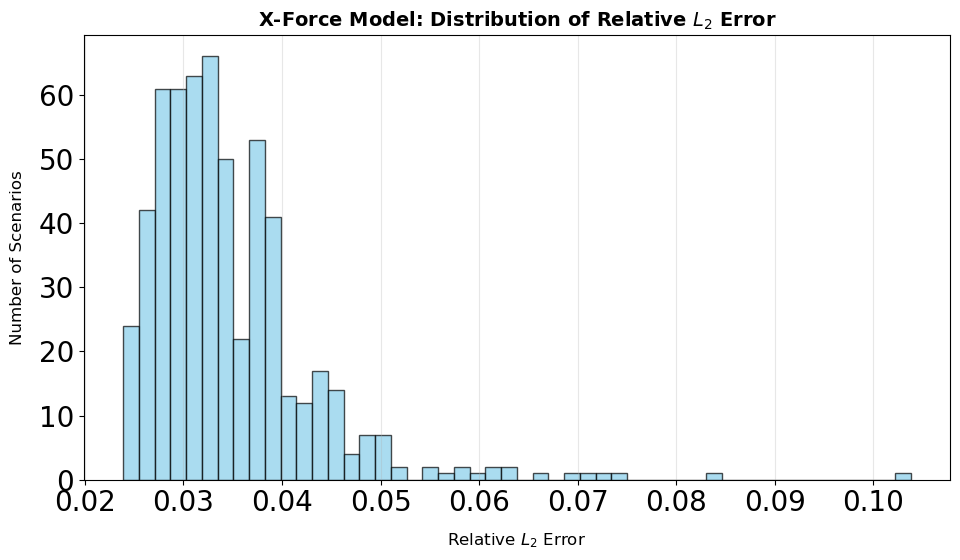

In [38]:
data = results_x["rel_l2_per_case"]
mean_val = np.mean(data)
median_val = np.median(data)

# 2. Plotting
plt.figure(figsize=(10, 6))
plt.hist(data, bins=50, color='skyblue', edgecolor='black', alpha=0.7)

plt.title("X-Force Model: Distribution of Relative $L_2$ Error", fontsize=14, fontweight='bold')
plt.xlabel("Relative $L_2$ Error", fontsize=12)
plt.ylabel("Number of Scenarios", fontsize=12)
plt.grid(axis='x', alpha=0.3)
plt.legend(loc='upper right')

# Optional: Set x-axis limit if you want to focus on the bulk of data (0-30%)
# plt.xlim(0, 30)

plt.tight_layout()
# plt.savefig("X-ForceModel_Distribution_RelativeL2Error.pdf")
plt.show()

In [39]:
# 1. Convert to array and handle NaNs (if any)
arr = np.asarray(results_x["rel_l2_per_case"])
valid_mask = np.isfinite(arr)

# 2. Get indices that sort the array in ascending order (Best to Worst)
sorted_indices = np.where(valid_mask)[0]
sorted_indices = sorted_indices[np.argsort(arr[valid_mask])]

# 3. Identify the Best 3 (lowest relative error)
best_3_indices = sorted_indices[:3]

# 4. Identify the Worst 3 (highest relative error)
# We take the last 3 and reverse them so the absolute worst is first
worst_3_indices = sorted_indices[-3:][::-1]

# --- Display Results ---

print("--- TOP 3 BEST SCENARIOS (Lowest L2 Error) ---")
for i, idx in enumerate(best_3_indices, 1):
    print(f"Rank {i}: Index {idx:4d} | Rel L2 Error: {arr[idx]:.2f}")

print("\n--- TOP 3 WORST SCENARIOS (Highest L2 Error) ---")
for i, idx in enumerate(worst_3_indices, 1):
    print(f"Rank {i}: Index {idx:4d} | Rel L2 Error: {arr[idx]:.2f}")

--- TOP 3 BEST SCENARIOS (Lowest L2 Error) ---
Rank 1: Index  493 | Rel L2 Error: 0.02
Rank 2: Index   39 | Rel L2 Error: 0.02
Rank 3: Index  451 | Rel L2 Error: 0.02

--- TOP 3 WORST SCENARIOS (Highest L2 Error) ---
Rank 1: Index  533 | Rel L2 Error: 0.10
Rank 2: Index  140 | Rel L2 Error: 0.08
Rank 3: Index  410 | Rel L2 Error: 0.07


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinM

Applying filter: Removing values <= -60


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Applying filter: Removing values <= -60


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Applying filter: Removing values <= -60


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Applying filter: Removing values <= -60


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Applying filter: Removing values <= -60


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Applying filter: Removing values <= -60


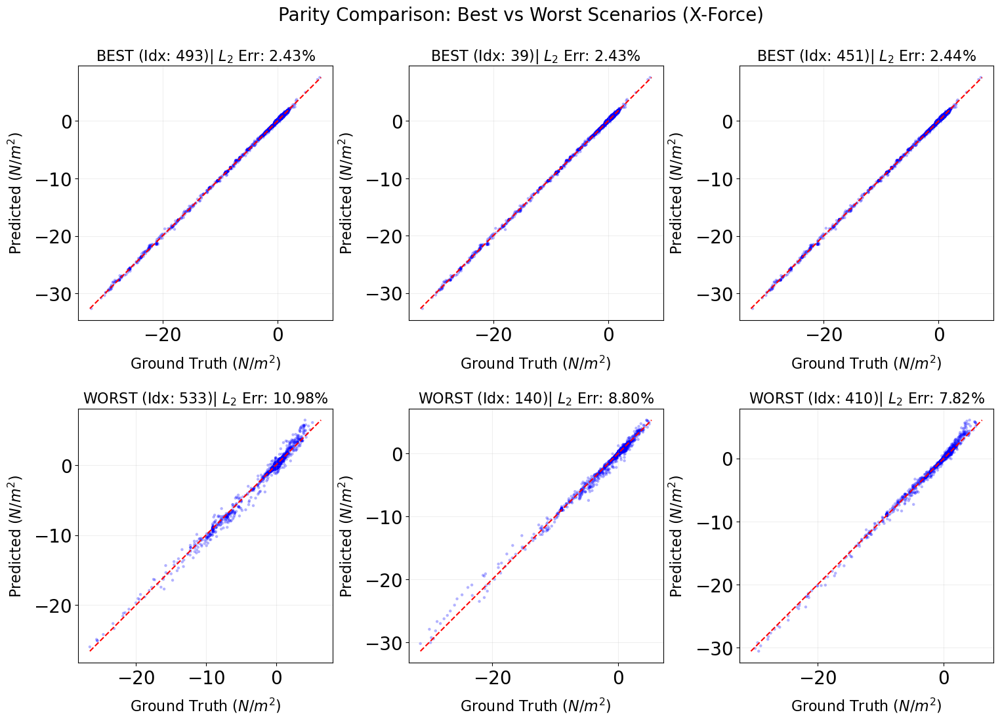

In [40]:
model_dir = "../../Models/model_DUCK_xforces"
component = "x"
# Assuming you already have best_3 and worst_3 indices
# Create a 2-row, 3-column figure
fig, axs = plt.subplots(2, 3, figsize=(18, 12)) 
plt.subplots_adjust(hspace=0.3, wspace=0.3)

# --- Top Row: Best 3 ---
for i, idx in enumerate(best_3_indices):
    plot_parity_subplot(axs[0, i], test_df, idx, xp_vector, yp_vector, 
                        model_dir, component="x", title_prefix="BEST", apply_outlier_filter=True, outlier_threshold=-60)

# --- Bottom Row: Worst 3 ---
for i, idx in enumerate(worst_3_indices):
    plot_parity_subplot(axs[1, i], test_df, idx, xp_vector, yp_vector, 
                        model_dir, component="x", title_prefix="WORST", apply_outlier_filter=True, outlier_threshold=-60)

fig.suptitle(f"Parity Comparison: Best vs Worst Scenarios (X-Force)", fontsize=20, y=0.95)
# plt.savefig('X-Forces Parity Comparison Plot.pdf')
plt.show()

### MAE and RMSE for Worst relative L2 Error Scenarios

In [41]:
x_case_metrics = ModelAnalysis.compute_per_case_metrics(
    test_df,
    xp_vector,
    yp_vector,
    model_dir="../../Models/model_DUCK_xforces",
    component="x",  
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinM

In [42]:
worst_point_row = x_case_metrics.loc[533]
print(worst_point_row)

wind_speed             8.000000
wind_dir               0.000000
wave_height            1.600000
wave_dir             160.000000
worst_point_error      2.553819
mae                    0.130405
rmse                   0.254426
Name: 533, dtype: float64


In [43]:
worst_point_row = x_case_metrics.loc[140]
print(worst_point_row)

wind_speed            7.000000
wind_dir             90.000000
wave_height           1.600000
wave_dir            -20.000000
worst_point_error     2.751261
mae                   0.098061
rmse                  0.211879
Name: 140, dtype: float64


In [44]:
worst_point_row = x_case_metrics.loc[410]
print(worst_point_row)

wind_speed             6.000000
wind_dir             135.000000
wave_height            1.600000
wave_dir             -20.000000
worst_point_error      2.507029
mae                    0.088626
rmse                   0.184638
Name: 410, dtype: float64


## Hsig

### Relative L2 Error Across All Test Scenarios

In [45]:

results_h = ModelAnalysis.compute_metrics_comprehensive(     
    test_df=test_df,
    xp_vector=xp_vector,
    yp_vector=yp_vector,
   model_dir="../../Models/model_DUCK_Hsig",
    component="hsig",
    )

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
2026-09-09 11:41:11.653682: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
/

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


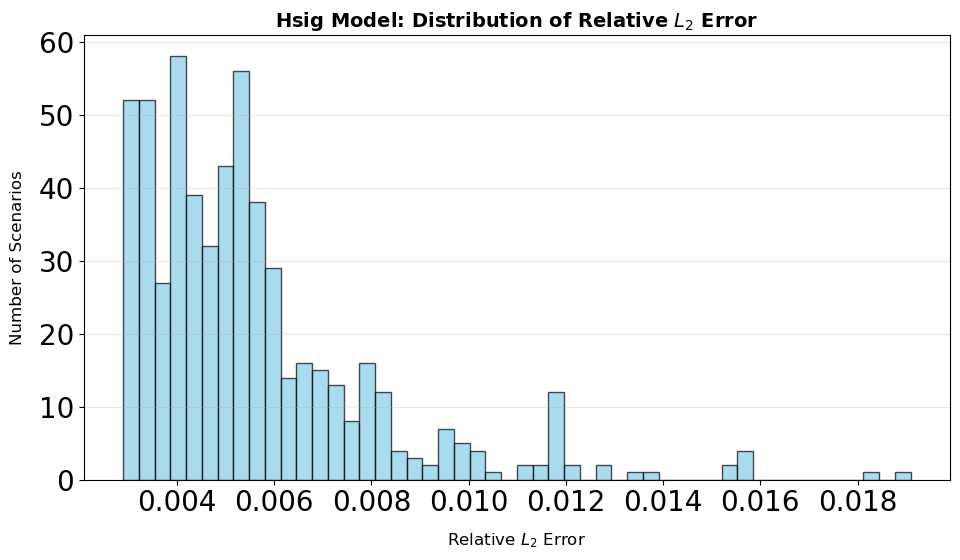

In [46]:
data = results_h["rel_l2_per_case"]
mean_val = np.mean(data)
median_val = np.median(data)

# 2. Plotting
plt.figure(figsize=(10, 6))
plt.hist(data, bins=50, color='skyblue', edgecolor='black', alpha=0.7)

plt.title("Hsig Model: Distribution of Relative $L_2$ Error", fontsize=14, fontweight='bold')
plt.xlabel("Relative $L_2$ Error", fontsize=12)
plt.ylabel("Number of Scenarios", fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.legend(loc='upper right')

plt.tight_layout()
# plt.savefig("HsigModel_Distribution_RelativeL2Error.pdf")
plt.show()

In [47]:
# 1. Convert to array and handle NaNs (if any)
arr = np.asarray(results_h["rel_l2_per_case"])
valid_mask = np.isfinite(arr)

# 2. Get indices that sort the array in ascending order (Best to Worst)
sorted_indices = np.where(valid_mask)[0]
sorted_indices = sorted_indices[np.argsort(arr[valid_mask])]

# 3. Identify the Best 3 (lowest relative error)
best_3_indices = sorted_indices[:3]

# 4. Identify the Worst 3 (highest relative error)
# We take the last 3 and reverse them so the absolute worst is first
worst_3_indices = sorted_indices[-3:][::-1]

# --- Display Results ---

print("--- TOP 3 BEST SCENARIOS (Lowest L2 Error) ---")
for i, idx in enumerate(best_3_indices, 1):
    print(f"Rank {i}: Index {idx:4d} | Rel L2 Error: {arr[idx]:.2f}")

print("\n--- TOP 3 WORST SCENARIOS (Highest L2 Error) ---")
for i, idx in enumerate(worst_3_indices, 1):
    print(f"Rank {i}: Index {idx:4d} | Rel L2 Error: {arr[idx]:.2f}")

--- TOP 3 BEST SCENARIOS (Lowest L2 Error) ---
Rank 1: Index  237 | Rel L2 Error: 0.00
Rank 2: Index  154 | Rel L2 Error: 0.00
Rank 3: Index  431 | Rel L2 Error: 0.00

--- TOP 3 WORST SCENARIOS (Highest L2 Error) ---
Rank 1: Index  520 | Rel L2 Error: 0.02
Rank 2: Index  140 | Rel L2 Error: 0.02
Rank 3: Index  410 | Rel L2 Error: 0.02


/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinM

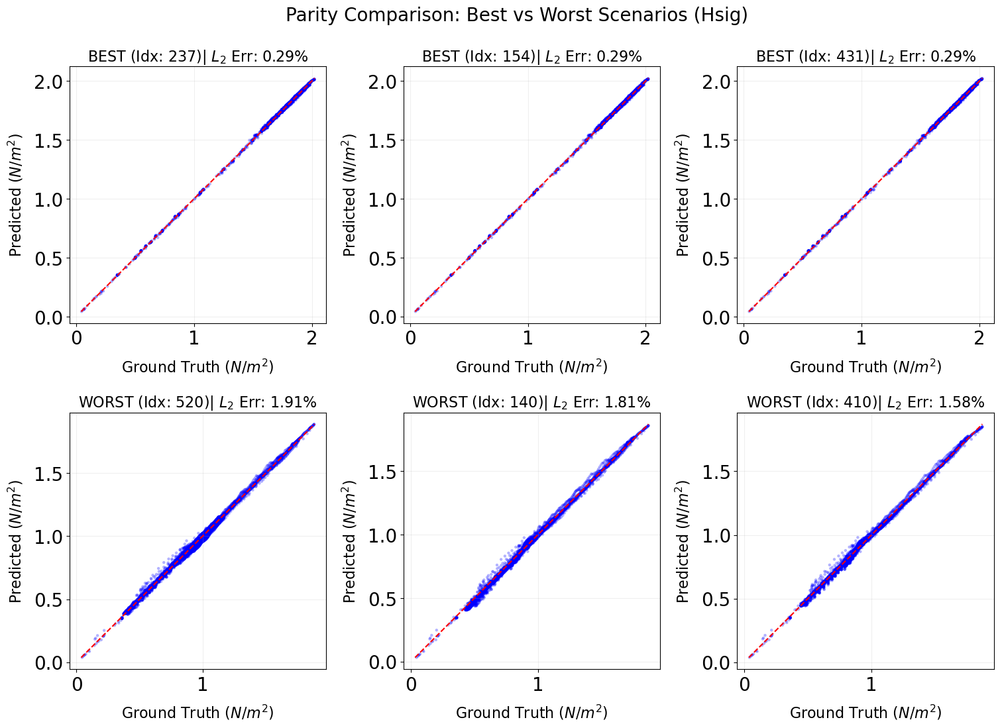

In [49]:
model_dir = "../../Models/model_DUCK_Hsig"
component = "hsig"
# Assuming you already have best_3 and worst_3 indices
# Create a 2-row, 3-column figure
fig, axs = plt.subplots(2, 3, figsize=(18, 12)) 
plt.subplots_adjust(hspace=0.3, wspace=0.3)

# --- Top Row: Best 3 ---
for i, idx in enumerate(best_3_indices):
    plot_parity_subplot(axs[0, i], test_df, idx, xp_vector, yp_vector, 
                        model_dir, component="hsig", title_prefix="BEST", apply_outlier_filter=False)

# --- Bottom Row: Worst 3 ---
for i, idx in enumerate(worst_3_indices):
    plot_parity_subplot(axs[1, i], test_df, idx, xp_vector, yp_vector, 
                        model_dir, component="hsig", title_prefix="WORST", apply_outlier_filter=False)

fig.suptitle(f"Parity Comparison: Best vs Worst Scenarios (Hsig)", fontsize=20, y=0.95)
# plt.savefig('X-Forces Parity Comparison Plot.pdf')
# Need to update the unit to m for Hsig
plt.show()

### MAE and RMSE Across Test Scenarios

In [50]:
h_case_metrics = ModelAnalysis.compute_per_case_metrics(
    test_df,
    xp_vector,
    yp_vector,
    model_dir="../../Models/model_DUCK_Hsig",
    component="hsig",  
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinM

In [51]:
worst_point_row = h_case_metrics.loc[520]
print(worst_point_row)

wind_speed             7.000000
wind_dir             315.000000
wave_height            1.600000
wave_dir             -20.000000
worst_point_error      0.098666
mae                    0.014387
rmse                   0.018558
Name: 520, dtype: float64


In [52]:
worst_point_row = h_case_metrics.loc[140]
print(worst_point_row)

wind_speed            7.000000
wind_dir             90.000000
wave_height           1.600000
wave_dir            -20.000000
worst_point_error     0.095414
mae                   0.012890
rmse                  0.017533
Name: 140, dtype: float64


In [53]:
worst_point_row = h_case_metrics.loc[410]
print(worst_point_row)

wind_speed             6.000000
wind_dir             135.000000
wave_height            1.600000
wave_dir             -20.000000
worst_point_error      0.100362
mae                    0.011521
rmse                   0.015297
Name: 410, dtype: float64


# Worst-Case Points per Scenario

## x-forces

In [54]:
worst_x_df = DataPlot.collect_max_error_points(
    test_df,
    xp_vector, yp_vector,
    component="x",
    model_dir="../../Models/model_DUCK_xforces",
    tensor_DON=False,
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinM

In [58]:
worst_x_df.sort_values(by="abs_error", ascending=True, inplace=True)

In [59]:
plt.rcdefaults()

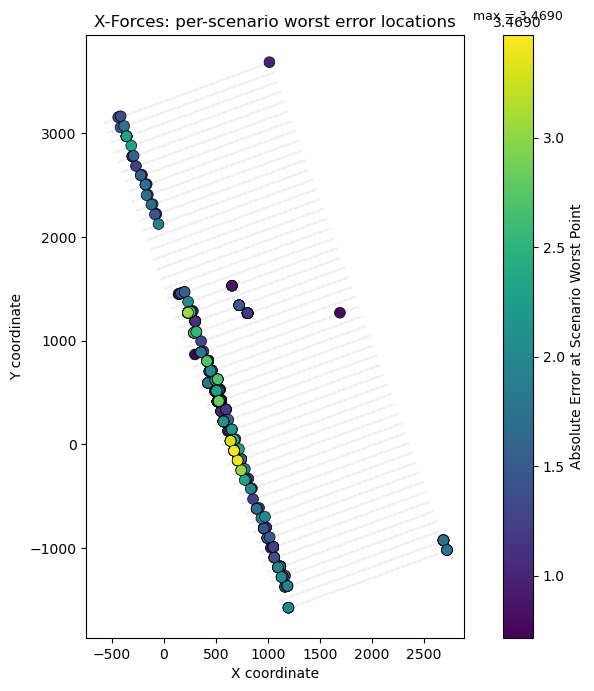

In [60]:
DataPlot.plot_max_errors_on_map(
    xp_vector, yp_vector,
    worst_points_df=worst_x_df,
    show_background=True,
    size_by_error=False,
    annotate_top_k=0,               # label the 8 worst cases
    fixed_vmin=None, fixed_vmax=None,  # set to numbers to lock color range
    title="X-Forces: per-scenario worst error locations",
    # save_dir="./",
    # save_name=None
)

## y-forces

In [61]:
worst_y_df = DataPlot.collect_max_error_points(
    test_df,
    xp_vector, yp_vector,
    component="y",
    model_dir="../../Models/model_DUCK_yforces",
    tensor_DON=False,
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinM

In [62]:
worst_y_df.sort_values(by="abs_error", ascending=True, inplace=True)

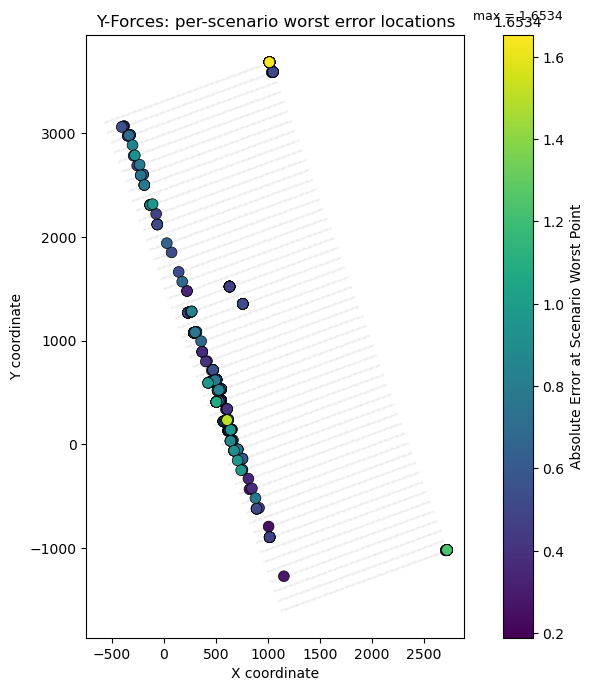

In [63]:
DataPlot.plot_max_errors_on_map(
    xp_vector, yp_vector,
    worst_points_df=worst_y_df,
    show_background=True,
    size_by_error=False,
    annotate_top_k=0,               # label the 8 worst cases
    fixed_vmin=None, fixed_vmax=None,  # set to numbers to lock color range
    title="Y-Forces: per-scenario worst error locations",
    # save_dir="./",
    # save_name=None
)

## Hsig

In [64]:
worst_hs_df = DataPlot.collect_max_error_points(
    test_df,
    xp_vector, yp_vector,
    component="hsig",
    model_dir="../../Models/model_DUCK_Hsig",
    tensor_DON=False,
)

/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.3.0 when using version 1.4.1.post1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/workspace/shukaic/miniconda3/envs/DON/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinM

In [65]:
worst_hs_df.sort_values(by="abs_error", ascending=True, inplace=True)

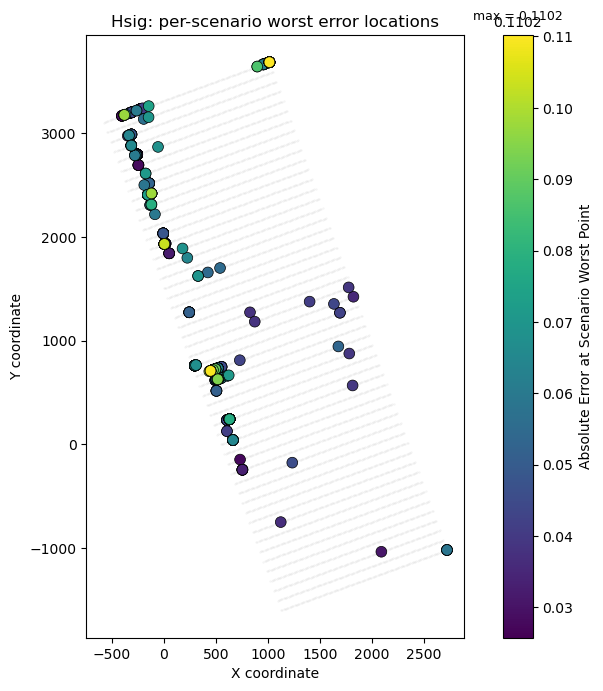

In [66]:
DataPlot.plot_max_errors_on_map(
    xp_vector, yp_vector,
    worst_points_df=worst_hs_df,
    show_background=True,
    size_by_error=False,
    annotate_top_k=0,               # label the 8 worst cases
    fixed_vmin=None, fixed_vmax=None,  # set to numbers to lock color range
    title="Hsig: per-scenario worst error locations",
    # save_dir="./",
    # save_name=None
)